In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os

In [2]:
df = pd.read_csv('../dataset/apartments_for_rent_classified_10K.csv',sep=';',encoding="cp1252", low_memory=False)

In [3]:
pd.set_option('display.max_colwidth', None)

In [4]:
df

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_feet,address,cityname,state,latitude,longitude,source,time
0,5668626895,housing/rent/apartment,"Studio apartment 2nd St NE, Uhland Terrace NE, Washington, DC 20002","This unit is located at second St NE, Uhland Terrace NE, Washington, DC 20002, Washington, 20002, DCMonthly rental rates range from $790 - $1090We have studio units available for rent",NaN,NaN,0.0,USD,No,Thumbnail,...,$790,Monthly,101,NaN,Washington,DC,38.9057,-76.9861,RentLingo,1577359415
1,5664597177,housing/rent/apartment,Studio apartment 814 Schutte Road,"This unit is located at 814 Schutte Road, Evansville, 47712, INMonthly rental rates range from $425 - $445We have studio - 1 beds units available for rent",NaN,NaN,1.0,USD,No,Thumbnail,...,$425,Monthly,106,814 Schutte Rd,Evansville,IN,37.9680,-87.6621,RentLingo,1577017063
2,5668626833,housing/rent/apartment,"Studio apartment N Scott St, 14th St N, Arlington, VA 22209","This unit is located at N Scott St, 14th St N, Arlington, VA 22209, Arlington, 22209, VAMonthly rental rates range from $1390We have studio units available for rent",NaN,1.0,0.0,USD,No,Thumbnail,...,"$1,390",Monthly,107,NaN,Arlington,VA,38.8910,-77.0816,RentLingo,1577359410
3,5659918074,housing/rent/apartment,Studio apartment 1717 12th Ave,"This unit is located at 1717 12th Ave, Seattle, 98122, WAMonthly rental rates range from $925We have studio units available for rent",NaN,1.0,0.0,USD,No,Thumbnail,...,$925,Monthly,116,1717 12th Avenue,Seattle,WA,47.6160,-122.3275,RentLingo,1576667743
4,5668626759,housing/rent/apartment,"Studio apartment Washington Blvd, N Cleveland St, Arlington","This unit is located at Washington Blvd, N Cleveland St, Arlington, Arlington, 22201, VAMonthly rental rates range from $880We have studio units available for rent",NaN,NaN,0.0,USD,No,Thumbnail,...,$880,Monthly,125,NaN,Arlington,VA,38.8738,-77.1055,RentLingo,1577359401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,5630240092,housing/rent/apartment,Five BR 5407 Abbott Place - Abbott,"This unit is located at 5407 Abbott Place - Abbott, Edina, 55410, MNMonthly rental rates range from $6000We have 5 beds units available for rent",NaN,4.0,5.0,USD,No,Thumbnail,...,"$6,000",Monthly,6300,5407 Abbott Place Abbott,Edina,MN,44.9000,-93.3233,RentLingo,1575112975
9996,5668640983,housing/rent/apartment,Six BR 256 Las Entradas,"This unit is located at 256 Las Entradas, Montecito, 93108, CAMonthly rental rates range from $25000We have 6 beds units available for rent",NaN,8.0,6.0,USD,No,Thumbnail,...,"$25,000",Monthly,8716,256 Las Entradas,Montecito,CA,34.4331,-119.6331,RentLingo,1577360419
9997,5668643292,housing/rent/apartment,Six BR 9908 Bentcross Drive,"This unit is located at 9908 Bentcross Drive, Potomac, 20854, MDMonthly rental rates range from $11000We have 6 beds units available for rent",NaN,8.5,6.0,USD,No,Thumbnail,...,"$11,000",Monthly,11318,9908 Bentcross Dr,Potomac,MD,39.0287,-77.2409,RentLingo,1577360560
9998,5668662559,housing/rent/apartment,One BR in New York NY 10069,"Monthly Rent$4,605 -to $4,790AmenitiesThe Aldyn offers some of the finest amenities amongst Upper West Side apartments. The club-style way of apartment living offers residents countless amenities right at their doorstep - the cornerstone being the 40,000 sq. feet La Palestra Athletic Club and Spa. This prestigious facility includes a 75 foot indoor pool, hot bath-tub, 38 foot rock climbing wall, basketball and squash courts, personal training, bowling alley, and more!Community Amenities 75 ft indoor swimming pool and hot bathtub 38 Rock Climbing Wall Elegant Roman and Williams designed lobby & lounge Childrens indoor children's play area by KIDVILLE Pets allowed Free shuttle to Columbus Circle & 72nd/Broadway Entertainment room with gourmet catering kitchen 24hr attendant at door/concierge services On-site parking garage Private landscaped cour

Baza se sastoji iz 10k instanci i 22 atributa. 

In [5]:
df['category'].value_counts()

category
housing/rent/apartment     9996
housing/rent/home             2
housing/rent/short_term       2
Name: count, dtype: int64

Sto se tice kateogrija, gotovo 100% je instanci apartman. Imajuci u vidu da se 'home' i 'apartment' idejno ne razlikuju previse, kao i to da termin 'short_term' oznacava stambenu jedinicu koja se izdaje na kraci period (1-6 meseci), svakako mozemo i te 4 instance pripojiti u kategoriju 'apartman'


In [6]:
df.loc[df['category'] == 'housing/rent/apartment', 'category'] = 'apartment'
df.loc[df['category'] == 'housing/rent/home', 'category'] = 'apartment'
df.loc[df['category'] == 'housing/rent/short_term', 'category'] = 'apartment'

Atributi koji je od veceg znacaja su cena i kvadratura stana. 

# Autlajeri

In [7]:
df['price'].describe()

count    10000.000000
mean      1486.277500
std       1076.507968
min        200.000000
25%        949.000000
50%       1270.000000
75%       1695.000000
max      52500.000000
Name: price, dtype: float64

Ovaj maksimum je moguce neka greska.

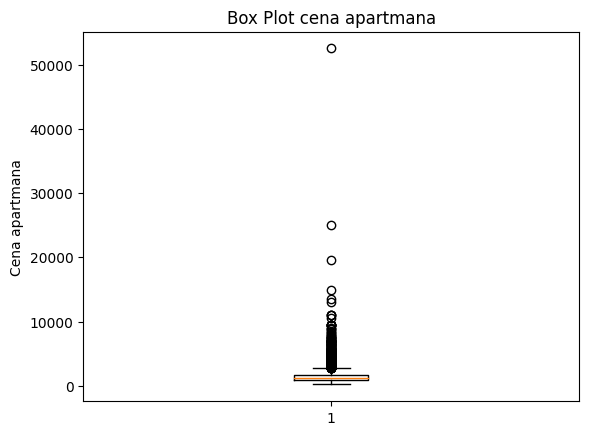

In [8]:
plt.boxplot(df['price'])

# Dodatno formatiranje grafa
plt.ylabel('Cena apartmana')
plt.title('Box Plot cena apartmana')
plt.show()

In [9]:
df.loc[df['price'] == 52500]['body']

8829    Barstow It's 14/18ft. studio apartment furnished include utilities, television, Internet hook up nice big deck. $500.00/ month $350.00 deposit. 1st month$450.00. A-c, Alarm, Balcony, Deck, Patio or Porch, Cable Ready, Microwave, Oversized Closets, Paid Utilities, Highspeed internet Available
Name: body, dtype: object

In [10]:
df.loc[df['price'] == 52500,'price'] = 500

Jos jedna provera:

In [11]:
df['price'].describe()

count    10000.000000
mean      1481.077500
std        947.983982
min        200.000000
25%        949.000000
50%       1270.000000
75%       1695.000000
max      25000.000000
Name: price, dtype: float64

In [12]:
df.loc[df['price'] == 25000]['title']

9996    Six BR 256 Las Entradas
Name: title, dtype: object

Ova jedinica vise nije za iznajmljivanje nego je na prodaju: <br>
https://www.redfin.com/CA/Santa-Barbara/256-Las-Entradas-Dr-93108/home/21610608 <br>tako da ponovo nije autlajer nego ekstremna vrednost i ne treba da se menja.

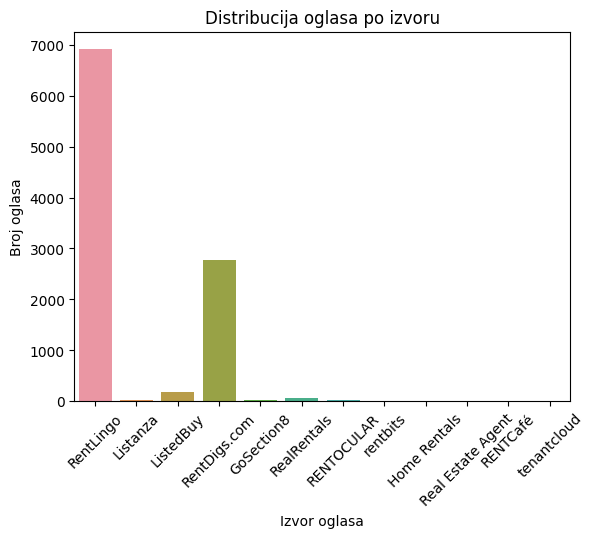

In [13]:
# Generisanje count plot-a za kategoricke vrednosti 'source'
sns.countplot(data=df, x='source')

# Dodatno formatiranje grafa
plt.xlabel('Izvor oglasa')
plt.ylabel('Broj oglasa')
plt.title('Distribucija oglasa po izvoru')
plt.xticks(rotation=45)  # Rotiranje oznaka x-ose za bolju čitljivost
plt.show()

Dve kategorije se izdvajaju, sa ociglednim pobednikom: RentLingo i ListedBuy

Ukoliko se fokus okrene samo na te dve kategorije, moze se primeniti nebalansirana binarna klasifikacija kasnije. Neka ga za sad

Ostaje jos jedan atirbut koji je od posebnog interesa - lokacija.

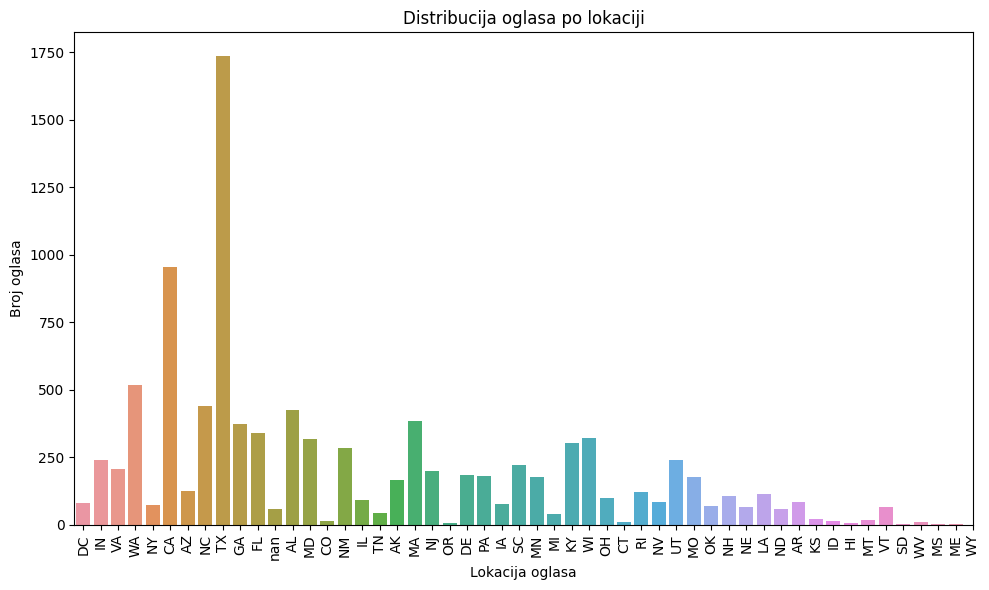

In [14]:
# Generisanje count plot-a za kategoricke vrednosti 'state'
# Postavljanje veličine grafa
plt.figure(figsize=(10, 6))

# Generisanje count plot-a za kategoricke vrednosti 'state'
sns.countplot(data=df, x='state')

# Dodatno formatiranje grafa
plt.xlabel('Lokacija oglasa')
plt.ylabel('Broj oglasa')
plt.title('Distribucija oglasa po lokaciji')

plt.xticks(rotation=90)
plt.xticks(range(len(df['state'].unique())), df['state'].unique()) 

plt.tight_layout()  # Bolje formatiranje layout-a
plt.show()

Najvise oglasa je pronadjeno za lokaciju Texas i California, dok je na trecem mestu Washington.

Najmanje ih ima u sledecim: South Dakota, Mississipi, Meine, Wyoming.

Ostala je jos kvadratura stana. Buduci da Evropljanima ne znaci puno jedinica za meru kao sto je square feet, bez gubljenja na kvalitetu rezultata se moze primeniti konverzija u standardne metre kvadratne. <br>
1 sqft = 0.092903 m2

In [15]:
df['square_feet'] = df['square_feet'] * 0.093
df.rename(columns={'square_feet' : 'square_meters'}, inplace=True)
df.head()

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_meters,address,cityname,state,latitude,longitude,source,time
0,5668626895,apartment,"Studio apartment 2nd St NE, Uhland Terrace NE, Washington, DC 20002","This unit is located at second St NE, Uhland Terrace NE, Washington, DC 20002, Washington, 20002, DCMonthly rental rates range from $790 - $1090We have studio units available for rent",NaN,NaN,0.0,USD,No,Thumbnail,...,$790,Monthly,9.393,NaN,Washington,DC,38.9057,-76.9861,RentLingo,1577359415
1,5664597177,apartment,Studio apartment 814 Schutte Road,"This unit is located at 814 Schutte Road, Evansville, 47712, INMonthly rental rates range from $425 - $445We have studio - 1 beds units available for rent",NaN,NaN,1.0,USD,No,Thumbnail,...,$425,Monthly,9.858,814 Schutte Rd,Evansville,IN,37.9680,-87.6621,RentLingo,1577017063
2,5668626833,apartment,"Studio apartment N Scott St, 14th St N, Arlington, VA 22209","This unit is located at N Scott St, 14th St N, Arlington, VA 22209, Arlington, 22209, VAMonthly rental rates range from $1390We have studio units available for rent",NaN,1.0,0.0,USD,No,Thumbnail,...,"$1,390",Monthly,9.951,NaN,Arlington,VA,38.8910,-77.0816,RentLingo,1577359410
3,5659918074,apartment,Studio apartment 1717 12th Ave,"This unit is located at 1717 12th Ave, Seattle, 98122, WAMonthly rental rates range from $925We have studio units available for rent",NaN,1.0,0.0,USD,No,Thumbnail,...,$925,Monthly,10.788,1717 12th Avenue,Seattle,WA,47.6160,-122.3275,RentLingo,1576667743
4,5668626759,apartment,"Studio apartment Washington Blvd, N Cleveland St, Arlington","This unit is located at Washington Blvd, N Cleveland St, Arlington, Arlington, 22201, VAMonthly rental rates range from $880We have studio units available for rent",NaN,NaN,0.0,USD,No,Thumbnail,...,$880,Monthly,11.625,NaN,Arlington,VA,38.8738,-77.1055,RentLingo,1577359401


In [16]:
df['square_meters'].describe()

count    10000.000000
mean        87.960376
std         60.985283
min          9.393000
25%         60.357000
50%         74.586000
75%        102.300000
max       3720.000000
Name: square_meters, dtype: float64

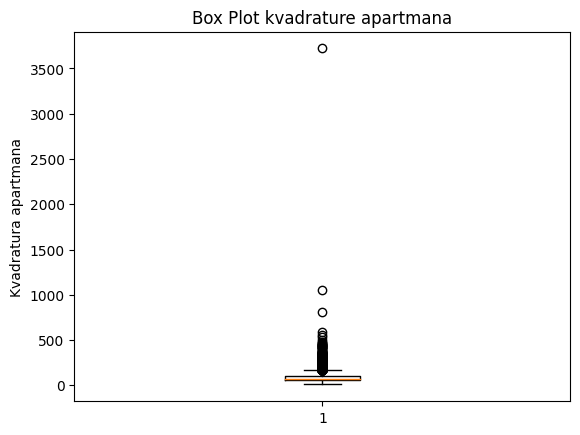

In [17]:
plt.boxplot(df['square_meters'])

# Dodatno formatiranje grafa
plt.ylabel('Kvadratura apartmana')
plt.title('Box Plot kvadrature apartmana')
plt.show()

In [18]:
df.loc[df['square_meters'] == 3720.0000]['title']

9998    One BR in New York NY 10069
Name: title, dtype: object

In [19]:
# Izračunavanje prosečne cene za jednosobne njujorkske apartmane 
df.loc[df['square_meters'] == 3720.0000, 'square_meters'] = 0
prosecna_kvadratura_jednosobnih = df[(df['bedrooms'] == 1) & (df['state'] == 'NY')]['square_meters'].mean()
df.loc[df['square_meters'] == 0, 'square_meters'] = 71

In [20]:
df['square_meters'].describe()

count    10000.000000
mean        87.595476
std         48.987726
min          9.393000
25%         60.357000
50%         74.586000
75%        102.300000
max       1052.574000
Name: square_meters, dtype: float64

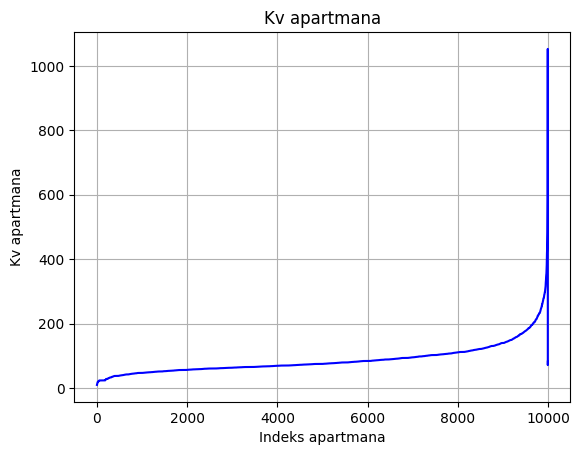

In [21]:
# Generisanje grafikona cene apartmana
plt.plot(df.index, df['square_meters'], color='blue', linestyle='-')

# Dodatno formatiranje grafa
plt.xlabel('Indeks apartmana')
plt.ylabel('Kv apartmana')
plt.title('Kv apartmana')
plt.grid(True)
plt.show()

In [22]:
df.loc[df['square_meters'] == 1052.574000]

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_meters,address,cityname,state,latitude,longitude,source,time
9997,5668643292,apartment,Six BR 9908 Bentcross Drive,"This unit is located at 9908 Bentcross Drive, Potomac, 20854, MDMonthly rental rates range from $11000We have 6 beds units available for rent",NaN,8.5,6.0,USD,No,Thumbnail,...,"$11,000",Monthly,1052.574,9908 Bentcross Dr,Potomac,MD,39.0287,-77.2409,RentLingo,1577360560


# Nedostajuce vrednosti

In [23]:
df.isna().sum()

id                  0
category            0
title               0
body                0
amenities        3549
bathrooms          34
bedrooms            7
currency            0
fee                 0
has_photo           0
pets_allowed     4163
price               0
price_display       0
price_type          0
square_meters       0
address          3327
cityname           77
state              77
latitude           10
longitude          10
source              0
time                0
dtype: int64

In [24]:
pd.set_option('display.max_colwidth', None)

In [25]:
def unique_values_for_attributes(dataframe, attributes):
    
    unique_values_dict = {}
    
    for attribute in attributes:
        unique_values = dataframe[attribute].unique()
        unique_values_dict[attribute] = unique_values
    
    return unique_values_dict

In [26]:
atributi = ['category', 'currency', 'fee','price_type']  
unique_values = unique_values_for_attributes(df, atributi)
print(unique_values)

{'category': array(['apartment'], dtype=object), 'currency': array(['USD'], dtype=object), 'fee': array(['No'], dtype=object), 'price_type': array(['Monthly', 'Weekly', 'Monthly|Weekly'], dtype=object)}


In [27]:
df['price_type'].value_counts()

price_type
Monthly           9998
Weekly               1
Monthly|Weekly       1
Name: count, dtype: int64

In [28]:
df.loc[(df['price_type'] == 'Weekly') | (df['price_type'] == 'Monthly|Weekly')]['body']

15                                                                                                                                                                                                                                                     New Bern Studio includes : 1 beds, 1 microwave, 1 mini fridge and a bath room. Cottages have linens, as well as towels. We have an indoor pool/spa, fitness, game, theater room and a catch and release pond! We are nestled away in the country but only ten min from downtown New Bern, the Neuse River, Trent River and only 1 hour from 3 different beaches. Rates are: $80.00 per night or $390.00 per week. Pets welcome for additional $10 per pet, per night and refundable $100 deposit. A-c, Alarm, Balcony, Deck, Patio or Porch, Cable Ready, Ceiling Fan(s), Microwave, Paid Utilities, Broadband internet Available, Disability access, Spa or Pool, Pool(s), Fitness center, Basketball Court(s), Smaller dogs allowed, Large Dogs , Cats allowed
235    A-P-T Sui

In [29]:
df.loc[df['price_type'] == 'Weekly','price'] = 390*4
df.loc[df['price_type'] == 'Weekly', 'price_type'] = 'Monthly'

In [30]:
df.loc[df['price_type'] == 'Monthly|Weekly','price'] = 275*4  # ova vrednost je rucno nadjena 
df.loc[df['price_type'] == 'Monthly|Weekly', 'price_type'] = 'Monthly'

In [31]:
df.drop(columns=['id','category','currency','fee','has_photo','price_display','price_type','time'], inplace=True)

In [32]:
df.dropna(subset=['longitude', 'latitude','cityname','state'], inplace=True)

In [33]:
df['pets_allowed'].value_counts()

pets_allowed
Cats,Dogs    5185
Cats          481
Dogs          123
Name: count, dtype: int64

U oko 60% apartmana, dozvoljeni su kucni ljubimci, pri cemu neznatno vise ljudi voli macke. Ova kolona nece dati mnogo diverziteta pri podacima tako da se i ona moze zanemariti. <br>
Kolona 'address' sadrzi previse specificnu lokaciju koja nece pomoci pri klasterovanju, tako da i ona moze da se ignorise.

In [34]:
df.drop(columns=['pets_allowed','address'], inplace=True)

In [35]:
df.isna().sum()

title               0
body                0
amenities        3500
bathrooms          34
bedrooms            7
price               0
square_meters       0
cityname            0
state               0
latitude            0
longitude           0
source              0
dtype: int64

## Popunjavanje nedostajucih vrednosti kod numerickih atributa

In [36]:
df['bathrooms'].describe()


count    9889.000000
mean        1.380777
std         0.616236
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         8.500000
Name: bathrooms, dtype: float64

In [37]:
df['bedrooms'].describe()

count    9916.000000
mean        1.744050
std         0.942759
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         9.000000
Name: bedrooms, dtype: float64

In [38]:
df['bathrooms'].fillna(df.groupby(['bedrooms'])['bathrooms'].transform(lambda x: np.floor(x.mean())), inplace=True)


In [39]:
df['bedrooms'].fillna(df.groupby(['bathrooms'])['bedrooms'].transform(lambda x: np.ceil(x.mean())), inplace=True)


Ostaje nam 3500 nedostajucih 'amenities', sto moze da bude ili veoma nebitno ili veliki problem, zato sto ne postoje kategorije koje mogu da budu 'pogodnosti'. Neki apartman ce da ima 'Refrigerator, Microwave', drugi ce da ima 'Hardwood floors, Pool, Gym', a treci ce da ima 'Microwave, Hardwood floors'.

In [40]:
df.isna().sum()

title               0
body                0
amenities        3500
bathrooms           1
bedrooms            1
price               0
square_meters       0
cityname            0
state               0
latitude            0
longitude           0
source              0
dtype: int64

In [41]:
df['amenities'].fillna('No listed amenities', inplace=True)

In [42]:
df.dropna(inplace=True)

In [43]:
df.isna().sum()

title            0
body             0
amenities        0
bathrooms        0
bedrooms         0
price            0
square_meters    0
cityname         0
state            0
latitude         0
longitude        0
source           0
dtype: int64

In [44]:
df.size

119064

In [45]:
import folium

# Kreiranje mape sa većim zumiranjem
m = folium.Map(location=[39.8283 , -98.5795], zoom_start=4)

# Dodavanje markera za svaku tačku
for index, row in df.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=row['title']).add_to(m)

# Prikaz mape
m

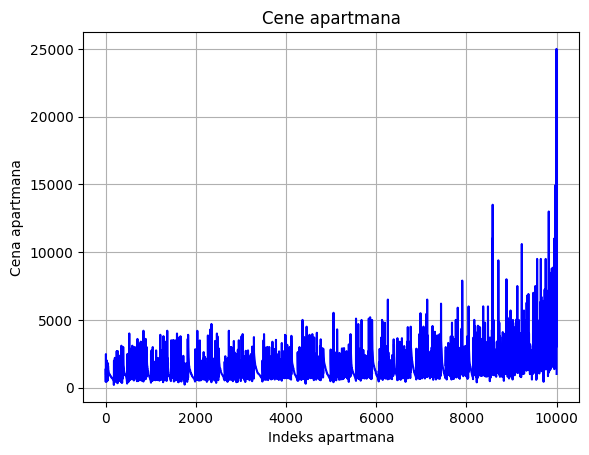

In [46]:
# Generisanje grafikona cene apartmana
plt.plot(df.index, df['price'], color='blue', linestyle='-')

# Dodatno formatiranje grafa
plt.xlabel('Indeks apartmana')
plt.ylabel('Cena apartmana')
plt.title('Cene apartmana')
plt.grid(True)
plt.show()

In [47]:
df['amenities']

0                                                                                              No listed amenities
1                                                                                              No listed amenities
2                                                                                              No listed amenities
3                                                                                              No listed amenities
4                                                                                              No listed amenities
                                                           ...                                                    
9995                                                                                           No listed amenities
9996                                                                                           No listed amenities
9997                                                                            

In [48]:
amenity_set = set() 
for amenity in df['amenities']:
    amenity = amenity.split(',')
    for item in amenity:
        amenity_set.add(item)

In [49]:
amenity_set

{'AC',
 'Alarm',
 'Basketball',
 'Cable or Satellite',
 'Clubhouse',
 'Dishwasher',
 'Doorman',
 'Elevator',
 'Fireplace',
 'Garbage Disposal',
 'Gated',
 'Golf',
 'Gym',
 'Hot Tub',
 'Internet Access',
 'Luxury',
 'No listed amenities',
 'Parking',
 'Patio/Deck',
 'Playground',
 'Pool',
 'Refrigerator',
 'Storage',
 'TV',
 'Tennis',
 'View',
 'Washer Dryer',
 'Wood Floors'}

In [50]:
df['luxury'] = 0

Ideja je da umesto title, body i amenities imam samo jednu kolonu, 'luxury', koja ce da bude indikator da li je jedinica otmena ili nije. Kriterijum za utvrdjivanje ce da bude postojanje pogodnosti kao sto su: Alarm, Basketball, Clubhouse, Doorman, Fireplace, Golf, Gym, Hot Tub, Luxury, Patio/Deck, Playground, Pool, Tennis, View, Wood Floors. <br>
Za jedinice kojima su pogodnosti navedene onda ce indikator biti izvucen odatle, a ako nije, nego ima vrednost 'No listed amenities', onda ce prolazak kroz body rec po rec obezbediti informaciju da li je stan elegantno opremljen ili nije. <br>
Problem je sto u opisu nisu sve reci lepo razdvojene razmakom, tako da ce pretraga biti sprovedena naivno. 

In [51]:
import re

# Funkcija za čišćenje teksta i razbijanje na reči
def preprocess_text(text):
    text = text.lower()
    text = ''.join([char if char.isalnum() or char.isspace() else ' ' for char in text])
    return text

In [52]:
luxury_set = set(['Alarm','Basketball','Clubhouse', 'Doorman', 'Fireplace', 'Golf', 'Gym', 'Hot Tub', 'Luxury', 'Patio/Deck', 'Playground', 'Pool', 'Tennis', 'View', 'Wood Floors'])

for index, row in df.iterrows():
    if row['amenities'] != 'No listed amenities':
        amenity = row['amenities'].split(',')
        for item in amenity:
            if(item in luxury_set):
                df.at[index, 'luxury'] = 1
    else:
        # Čišćenje i razbijanje pasusa na reči
        cleaned_pasus = preprocess_text(row['body'])
        reci_u_pasusu = cleaned_pasus.split()

        # Provera da li pasus sadrži reči iz luxury_set koristeći regularne izraze
        for rec in reci_u_pasusu:
            if any(re.search(rf'\b{re.escape(rec)}\b', luxury_rec, re.IGNORECASE) for luxury_rec in luxury_set):
                df.at[index, 'luxury'] = 1

        
        


In [53]:
df.iloc[149]['body']

'This unit is located at White Ave, Baltimore, 21206, MDMonthly rental rates range from $650We have 1 beds units available for rent Apartment features include:-- Pool- Furnished'

In [54]:
df.iloc[149]['luxury']

1

In [55]:
df.iloc[149]['amenities']

'Pool'

# Jupii
Sad mogu da izbrisem title, body i amenities

In [56]:
df.drop(columns=['body','amenities'], inplace=True)

In [57]:
df

,title,bathrooms,bedrooms,price,square_meters,cityname,state,latitude,longitude,source,luxury
0,"Studio apartment 2nd St NE, Uhland Terrace NE, Washington, DC 20002",1.0,0.0,790,9.393,Washington,DC,38.9057,-76.9861,RentLingo,0
1,Studio apartment 814 Schutte Road,1.0,1.0,425,9.858,Evansville,IN,37.9680,-87.6621,RentLingo,0
2,"Studio apartment N Scott St, 14th St N, Arlington, VA 22209",1.0,0.0,1390,9.951,Arlington,VA,38.8910,-77.0816,RentLingo,0
3,Studio apartment 1717 12th Ave,1.0,0.0,925,10.788,Seattle,WA,47.6160,-122.3275,RentLingo,0
4,"Studio apartment Washington Blvd, N Cleveland St, Arlington",1.0,0.0,880,11.625,Arlington,VA,38.8738,-77.1055,RentLingo,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,Five BR 5407 Abbott Place - Abbott,4.0,5.0,6000,585.900,Edina,MN,44.9000,-93.3233,RentLingo,0
9996,Six BR 256 Las Entradas,8.0,6.0,25000,810.588,Montecito,CA,34.4331,-119.6331,RentLingo,0
9997,Six BR 9908 Bentcross Drive,8.5,6.0,11000,1052.574,Potomac,MD,39.0287,-77.2409,RentLingo,0
9998,One BR in New York NY 10069,1.0,1.0,4790,71.000,New York,NY,40.7716,-73.9876,Listanza,1


Vreme je da podelimo bazu na test i trening skup

In [58]:
from sklearn.model_selection import train_test_split


# Odvajanje ciljnog atributa 'price' od ostalih atributa
X = df.drop('price', axis=1)  # Svi atributi osim 'price'
y = df['price']  # Samo 'price' atribut

# Podela podataka na trening i test skup (80% za trening, 20% za test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ispis informacija o veličini trening i test skupa
print("Veličina X_train:", len(X_train))
print("Veličina X_test:", len(X_test))
print("Veličina y_train:", len(y_train))
print("Veličina y_test:", len(y_test))

Veličina X_train: 7937
Veličina X_test: 1985
Veličina y_train: 7937
Veličina y_test: 1985


In [59]:
from joblib import dump
dump((X_train, X_test, y_train, y_test), 'classification_data.joblib')

['classification_data.joblib']

In [60]:
df.to_csv('apartments_preprocessed.csv', index=False)